<a href="https://colab.research.google.com/github/leandrojgama/Bootcamp-Imersao-em-Data-Science-Level-Up-2022/blob/main/Desafio_Bootcamp_Data_Science.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Verificação dos dados

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
#!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 22.0 MB 135 kB/s
     |████████████████████████████████| 102 kB 25.7 MB/s 
     |████████████████████████████████| 690 kB 52.3 MB/s 
     |████████████████████████████████| 4.7 MB 44.7 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 9.8 MB 49.5 MB/s 
     |████████████████████████████████| 296 kB 49.7 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.1-py2.py3-none-any.whl size=310100 sha256=6fbe96017065b4c67f9431db28f487145e34e39740665d4f5c7e33e089fdd4c2
  Stored in directory: /tmp/pip-ephem-wheel-cache-lvfqa1wh/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=c7777631a39c8307b9e5a5c2f5e3d9d767c2a05adc5880e4f4dc1a93c3ac5b8c
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba86876882394

In [2]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

# visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('classic')
%matplotlib inline
# set some options in pandas
pd.set_option('display.max_columns', 140)
pd.set_option('display.max_rows', 140)
#----------------------------------------------------------------------------------------------------------------
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder, OrdinalEncoder
#from category_encoders import TargetEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
#----------------------------------------------------------------------------------------------------------------
from sklearn.metrics import accuracy_score, log_loss,plot_confusion_matrix,precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import (
    RandomForestClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression

#----------------------------------------------------------------------------------------------------------------
import warnings 
warnings.filterwarnings('ignore')

Descrição das colunas
- Temperatura do ar
- Umidade do ar
- TVOC:
Compostos Orgânicos Voláteis Totais; medido em partes por bilhão ( Fonte )
- eCO2: concentração equivalente de co2; calculado a partir de valores diferentes como TVCO
- H2 bruto: hidrogênio molecular bruto; não compensado (Viés, temperatura, etc.)
- Etanol bruto: gás etanol bruto ( Fonte )
- Pressão do ar 
- PM 1,0 e PM 2,5: tamanho do material particulado < 1,0 µm (PM1,0). 1,0 µm < 2,5 µm (PM2,5)
- Alarme de incêndio: a verdade do solo é "1" se houver um incêndio
- CNT: contador de amostra
- UTC: timestamp UTC segundos
- NC0.5/NC1.0 e NC2.5: Concentração numérica de material particulado. Isso difere de PM porque NC fornece o número real de partículas no ar. O NC bruto também é classificado pelo tamanho de partícula: < 0,5 µm (NC0,5); 0,5 µm < 1,0 µm (NC1,0); 1,0 µm < 2,5 µm (NC2,5);


In [5]:
#df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Estudos/Bootcamp Ronilson odemir/Desafio/Dados_Detecção_Fumasa.csv')
df=pd.read_csv('https://github.com/leandrojgama/Bootcamp-Imersao-em-Data-Science-Level-Up-2022/blob/main/Dados_Detec%C3%A7%C3%A3o_Fumasa.csv?raw=true')
df.drop(['Unnamed: 0','UTC','CNT'],axis=1,inplace=True)
df.head()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
0,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0
1,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,0
2,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,0
3,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,0
4,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,0


In [6]:
df.head()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
0,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0
1,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,0
2,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,0
3,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,0
4,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,0


In [7]:
df.tail()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
62625,18.438,15.79,625,400,13723,20569,936.670,0.63,0.65,4.32,0.673,0.015,0
62626,18.653,15.87,612,400,13731,20588,936.678,0.61,0.63,4.18,0.652,0.015,0
62627,18.867,15.84,627,400,13725,20582,936.687,0.57,0.60,3.95,0.617,0.014,0
62628,19.083,16.04,638,400,13712,20566,936.680,0.57,0.59,3.92,0.611,0.014,0
62629,19.299,16.52,643,400,13696,20543,936.676,0.57,0.59,3.90,0.607,0.014,0


In [ ]:
df.isnull().any()

Temperature[C]    False
Humidity[%]       False
TVOC[ppb]         False
eCO2[ppm]         False
Raw H2            False
Raw Ethanol       False
Pressure[hPa]     False
PM1.0             False
PM2.5             False
NC0.5             False
NC1.0             False
NC2.5             False
CNT               False
Fire Alarm        False
dtype: bool

In [12]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62630 entries, 0 to 62629
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Temperature[C]  62630 non-null  float64
 1   Humidity[%]     62630 non-null  float64
 2   TVOC[ppb]       62630 non-null  int64  
 3   eCO2[ppm]       62630 non-null  int64  
 4   Raw H2          62630 non-null  int64  
 5   Raw Ethanol     62630 non-null  int64  
 6   Pressure[hPa]   62630 non-null  float64
 7   PM1.0           62630 non-null  float64
 8   PM2.5           62630 non-null  float64
 9   NC0.5           62630 non-null  float64
 10  NC1.0           62630 non-null  float64
 11  NC2.5           62630 non-null  float64
 12  CNT             62630 non-null  int64  
 13  Fire Alarm      62630 non-null  int64  
dtypes: float64(8), int64(6)
memory usage: 6.7 MB


# Exploração dos dados usando alguma biblioteca

In [ ]:
profile=ProfileReport(df,title='Detecção de Fumaça', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

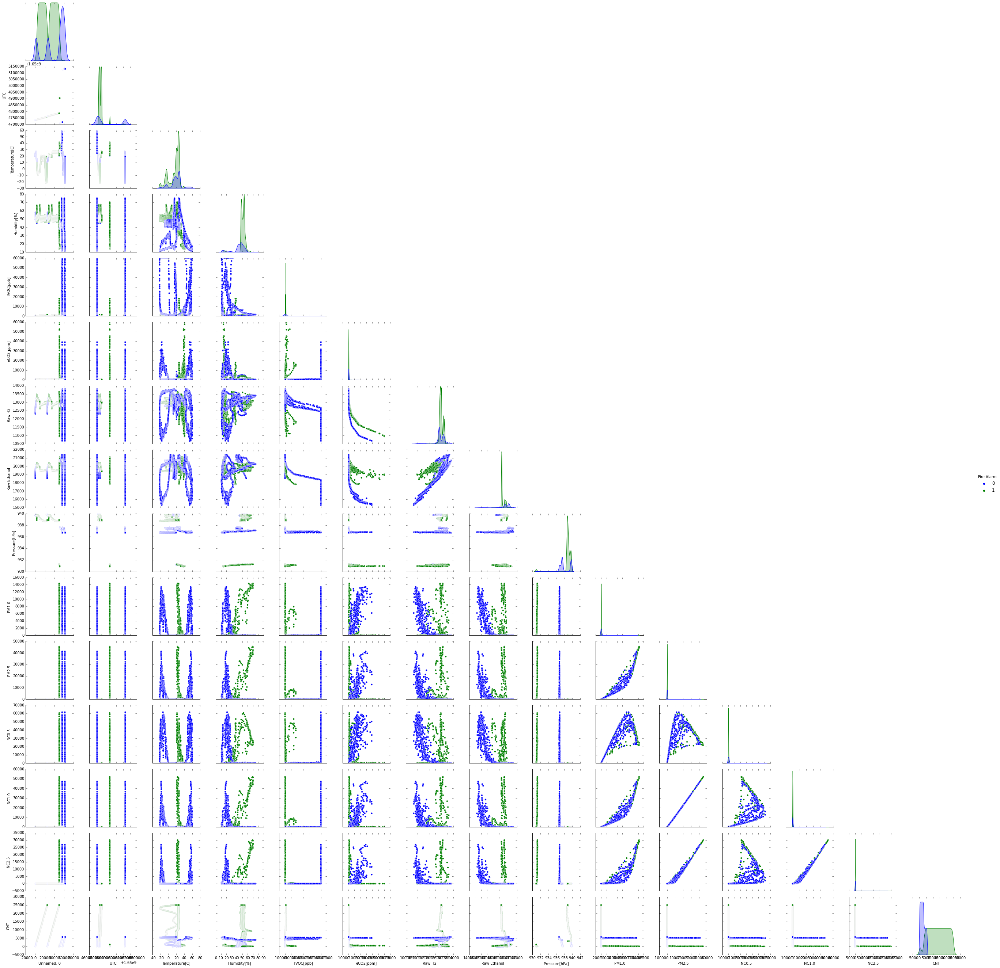

In [ ]:
sns.pairplot(df, hue='Fire Alarm',corner=True) 

# Análises estatísticas


In [ ]:
df.describe()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
count,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000
mean,15.970424,48.539499,1942.057528,670.021044,12942.453936,19754.257912,938.627649,100.594309,184.467770,491.463608,203.586487,80.049042,10511.386157,0.714626
std,14.359576,8.865367,7811.589055,1905.885439,272.464305,609.513156,1.331344,922.524245,1976.305615,4265.661251,2214.738556,1083.383189,7597.870997,0.451596
min,-22.010000,10.740000,0.000000,400.000000,10668.000000,15317.000000,930.852000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.994250,47.530000,130.000000,400.000000,12830.000000,19435.000000,938.700000,1.280000,1.340000,8.820000,1.384000,0.033000,3625.250000,0.000000
50%,20.130000,50.150000,981.000000,400.000000,12924.000000,19501.000000,938.816000,1.810000,1.880000,12.450000,1.943000,0.044000,9336.000000,1.000000
75%,25.409500,53.240000,1189.000000,438.000000,13109.000000,20078.000000,939.418000,2.090000,2.180000,14.420000,2.249000,0.051000,17164.750000,1.000000
max,59.930000,75.200000,60000.000000,60000.000000,13803.000000,21410.000000,939.861000,14333.690000,45432.260000,61482.030000,51914.680000,30026.438000,24993.000000,1.000000


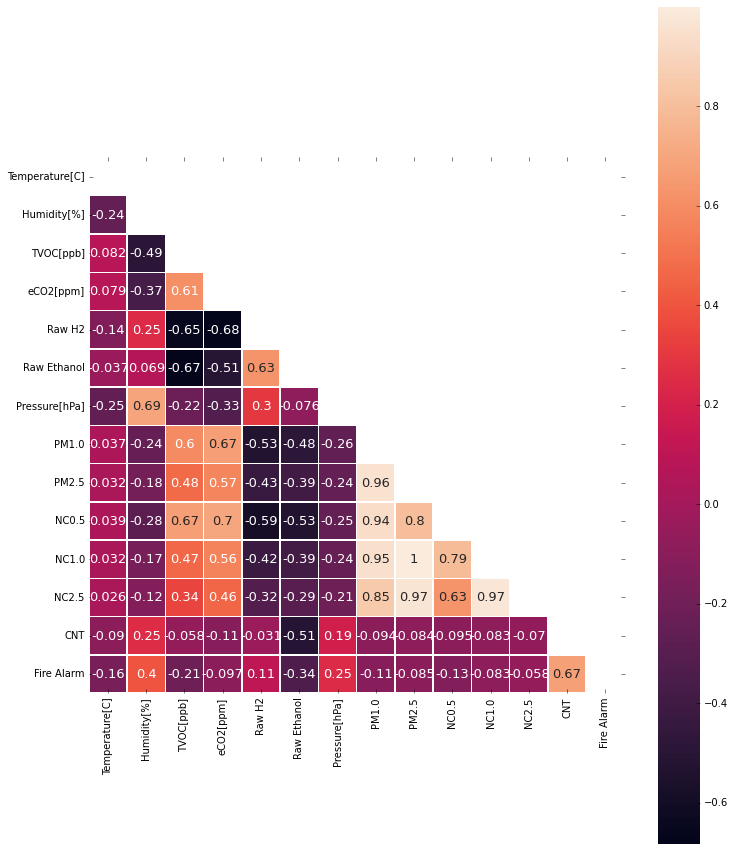

In [ ]:
correlacao = df.corr()

mask = np.zeros_like(correlacao)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(12,15)) 
ax=sns.heatmap(correlacao,
            annot = True,
            mask = mask,
            square = True,
            annot_kws={'size': 13}
            ,linewidths=.5
            )


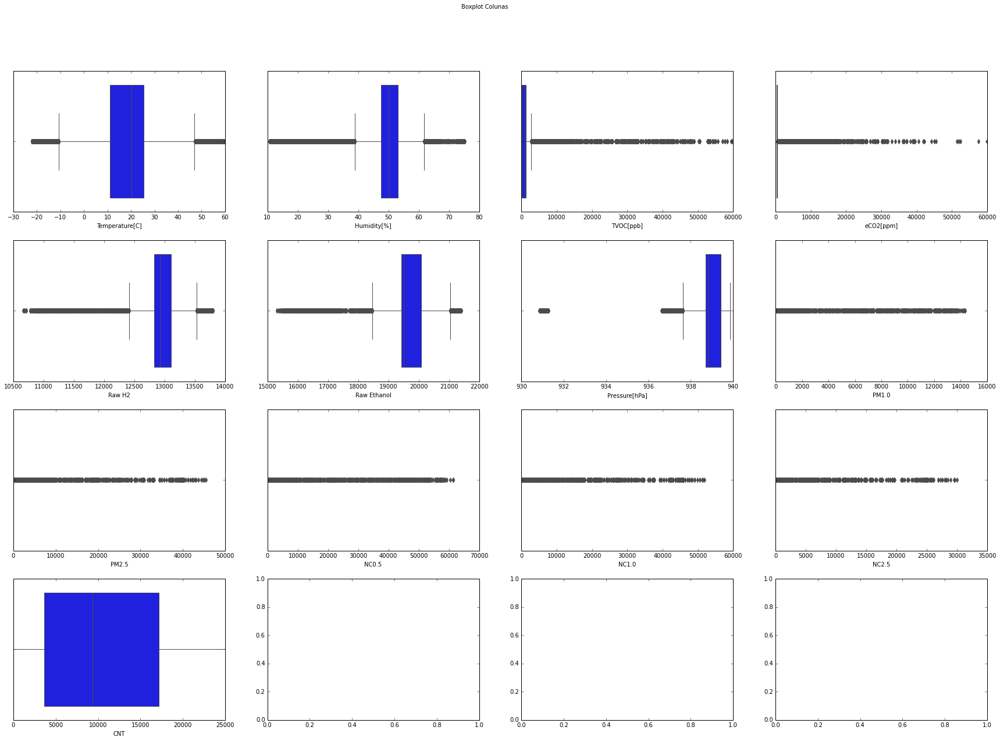

In [ ]:
col=list(df.columns)
col.remove('Fire Alarm')
col

linha=4
coluna=4
lencol=len(col)
i=0
fig, axes = plt.subplots(linha, coluna, figsize=(30,20))

fig.suptitle('Boxplot Colunas')
for l in range(linha):
  for c in range(coluna):
    if i<lencol:
      sns.boxplot(ax=axes[l,c], data=df, x=col[i])
      i+=1



# Divisão dos dados de treino e teste 

In [ ]:
X=df.drop(columns='Fire Alarm')
Y=df['Fire Alarm']

# Métricas de avaliação (Matriz de confusão e Relatório de classificação )


In [ ]:
def model_test(X_train, X_test, Y_train, Y_test):
  classifiers = [
      
      SVC(),
      LogisticRegression(),
      DecisionTreeClassifier(),
      RandomForestClassifier(),
      AdaBoostClassifier(),
      GradientBoostingClassifier(),
      
  ]

  for classifier in classifiers:
      model = classifier
      model.fit(X_train, Y_train)

      predict = model.predict(X_test)
      accuracy = accuracy_score(Y_test, predict) * 100
      precision=precision_score(Y_test, predict,average='weighted') * 100
      

      print(classifier)
      print("A acurácia foi de: {:.2f}%.".format(accuracy))
      print("A Precisão foi de: {:.2f}%.".format(precision))
      #print("model score: %.3f" % model.score(X_test, Y_test))
      print('-------------------------------')


## Teste de diversos modelos sem normalizar os dados

In [ ]:

SEED = 10
X_train, X_test, y_train, y_test =train_test_split(
    X,
    Y,
    test_size = 0.3,
    random_state = SEED
)
model_test(X_train, X_test, y_train, y_test)

SVC()
A acurácia foi de: 97.85%
A Precisão foi de: 97.91%
-------------------------------
LogisticRegression()
A acurácia foi de: 98.57%
A Precisão foi de: 98.63%
-------------------------------
DecisionTreeClassifier()
A acurácia foi de: 99.98%
A Precisão foi de: 99.98%
-------------------------------
RandomForestClassifier()
A acurácia foi de: 100.00%
A Precisão foi de: 100.00%
-------------------------------
AdaBoostClassifier()
A acurácia foi de: 99.99%
A Precisão foi de: 99.99%
-------------------------------
GradientBoostingClassifier()
A acurácia foi de: 100.00%
A Precisão foi de: 100.00%
-------------------------------


## Teste de diverso modelos normalizando com MinMaxScaler

In [ ]:
min_max_scaler = MinMaxScaler(feature_range = (0, 1))
data_min_max = min_max_scaler.fit_transform(X)
data_min_max = pd.DataFrame(data_min_max, columns = X.columns)
SEED = 10
X_train, X_test, y_train, y_test =train_test_split(
    data_min_max,
    Y,
    test_size = 0.3,
    random_state = SEED
)
model_test(X_train, X_test, y_train, y_test)

SVC()
A acurácia foi de: 99.93%
A Precisão foi de: 99.93%
-------------------------------
LogisticRegression()
A acurácia foi de: 96.69%
A Precisão foi de: 96.72%
-------------------------------
DecisionTreeClassifier()
A acurácia foi de: 99.98%
A Precisão foi de: 99.98%
-------------------------------
RandomForestClassifier()
A acurácia foi de: 100.00%
A Precisão foi de: 100.00%
-------------------------------
AdaBoostClassifier()
A acurácia foi de: 99.99%
A Precisão foi de: 99.99%
-------------------------------
GradientBoostingClassifier()
A acurácia foi de: 100.00%
A Precisão foi de: 100.00%
-------------------------------


In [ ]:

standard_scaler = StandardScaler()
data_standard = standard_scaler.fit_transform(X)
data_standard = pd.DataFrame(data_standard, columns = X.columns)

SEED = 10
X_train, X_test, y_train, y_test =train_test_split(
    data_standard,
    Y,
    test_size = 0.3,
    random_state = SEED
)
model_test(X_train, X_test, y_train, y_test)

SVC()
A acurácia foi de: 99.97%
A Precisão foi de: 99.97%
-------------------------------
LogisticRegression()
A acurácia foi de: 98.89%
A Precisão foi de: 98.89%
-------------------------------
DecisionTreeClassifier()
A acurácia foi de: 99.98%
A Precisão foi de: 99.98%
-------------------------------
RandomForestClassifier()
A acurácia foi de: 99.99%
A Precisão foi de: 99.99%
-------------------------------
AdaBoostClassifier()
A acurácia foi de: 99.99%
A Precisão foi de: 99.99%
-------------------------------
GradientBoostingClassifier()
A acurácia foi de: 100.00%
A Precisão foi de: 100.00%
-------------------------------


## Random Forest
Modelo escolhido devido a sua precisão elevada,sem a utilização de normalização pois.O modelo será utilizado sem normalização pois não ouve um incremento na acurácia e precisão.


In [ ]:
SEED = 10
X_train, X_test, y_train, y_test =train_test_split(
    X,
    Y,
    test_size = 0.3,
    random_state = SEED
)

# Intanciasr
random_forrest = RandomForestClassifier(max_depth=8)

# Treinar o modelo
random_forrest.fit(X_train, y_train)
predict = random_forrest.predict(X_test)
accuracy = accuracy_score(y_test, predict) * 100
precision=precision_score(y_test, predict,average='weighted')*100
print("A acurácia foi de: {:.2f}%.".format(accuracy))
print("A Precisão foi de: {:.2f}%.".format(precision))
print("Recall: {:.2f}%.".format(recall_score(y_test, predict,average='weighted')*100))
print("F1 Score: {:.2f}%.".format(f1_score(y_test, predict,average='weighted')*100))


A acurácia foi de: 100.00%.
A Precisão foi de: 100.00%.
Recall: 100.00%.
F1 Score: 100.00%.


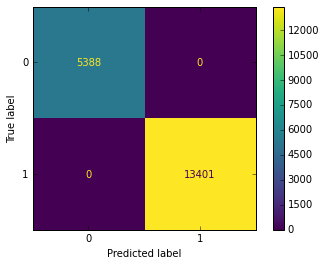

In [ ]:

plot_confusion_matrix(random_forrest, X_test, y_test)